The dataset supplied for this project has many bad files that either not image files or image files that are corrupt. Without fixing these, the project can not be done. I have done this separately. The code for this and the output it generated for test and train data can be viewed here

code :[fix_bad_files.py](https://github.com/tksundar/historical-structure-identification/blob/master/fix_bad_files.py)

train_data_output : [train_data_output](https://raw.githubusercontent.com/tksundar/historical-structure-identification/refs/heads/master/bad_files_fixed_train.txt)

test_data_output : [test_data_output ](https://github.com/tksundar/historical-structure-identification/blob/master/bad_files_fixeed_test.txt)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from zipfile import ZipFile

file_path = '/content/drive/MyDrive/DL/dataset_hist_structures.zip'
extract_path = '/content/drive/MyDrive/DL'

zip_ref = ZipFile(file_path,'r')
zip_ref.extractall(extract_path)
zip_ref.close()

In [5]:
# test_data_path = '/kaggle/input/ds-hist-structures/dataset_hist_structure/Dataset_test/Dataset_test_original_1478'
# train_data_path = '/kaggle/input/ds-hist-structures/dataset_hist_structure/Structures_Dataset'

test_data_path = '/content/drive/MyDrive/DL/dataset_hist_structures/Dataset_test/Dataset_test_original_1478'
train_data_path = '/content/drive/MyDrive/DL/dataset_hist_structures/Stuctures_Dataset'

In [3]:

import os
import pathlib
import warnings
warnings.filterwarnings('ignore')

height = 224
width = 224
batch_size = 64
total_train_images = 0
total_test_images = 0



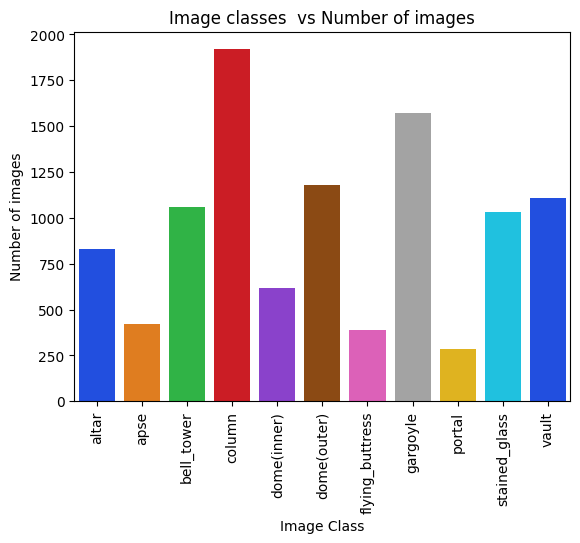

,altar,apse,bell_tower,column,dome(inner),dome(outer),flying_buttress,gargoyle,portal,stained_glass,vault
0,829,423,1059,1919,616,1177,387,1571,287,1033,1110


In [6]:
import os
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import pathlib


def get_subdirectories(directory):
    with os.scandir(directory) as entries:
        return [entry.name for entry in entries if entry.is_dir()]
sub_dirs = get_subdirectories(pathlib.Path(train_data_path))
images = {}

for d in sub_dirs:

    images[d] = [len(os.listdir(train_data_path+'/'+d))]

df = pd.DataFrame(images)
sns.barplot(data = df ,palette= sns.color_palette("bright"))
plt.xlabel('Image Class')
plt.ylabel('Number of images')
plt.title(f'Image classes  vs Number of images' )
plt.xticks(rotation = 90)
plt.show()
df

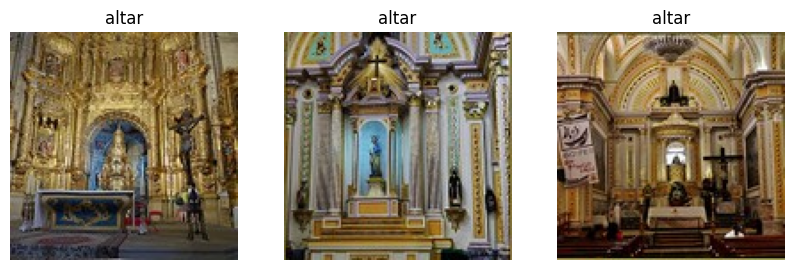

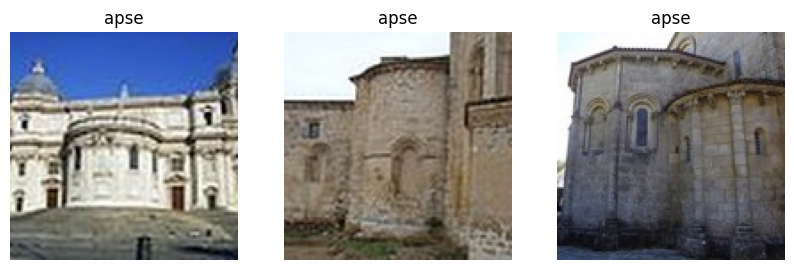

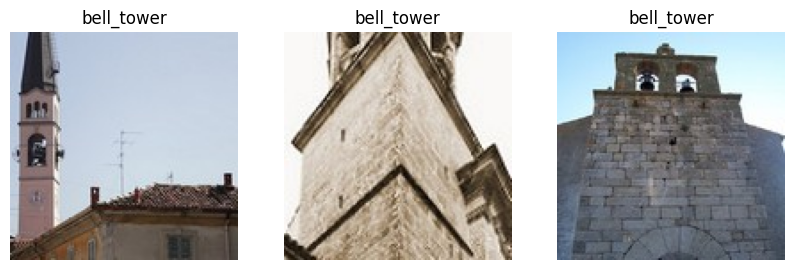

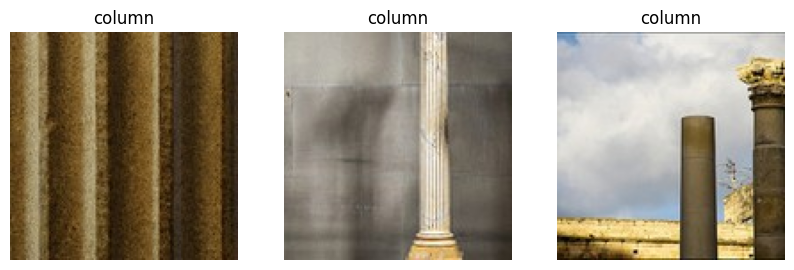

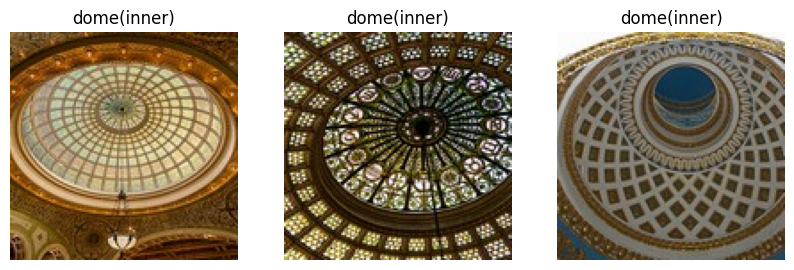

...

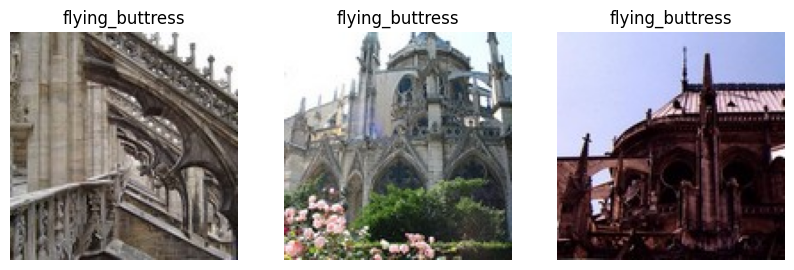

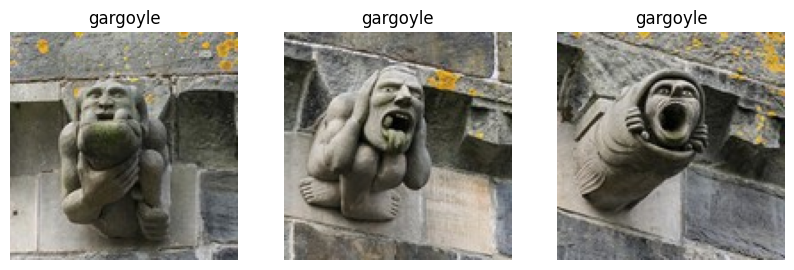

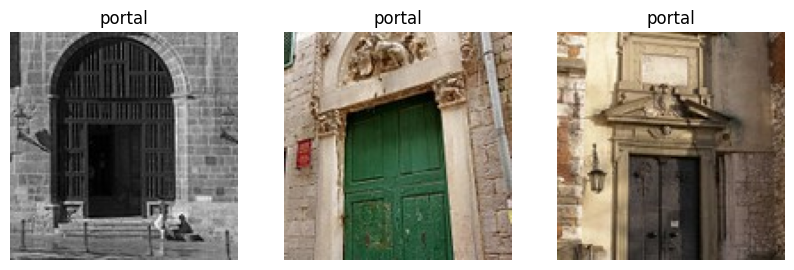

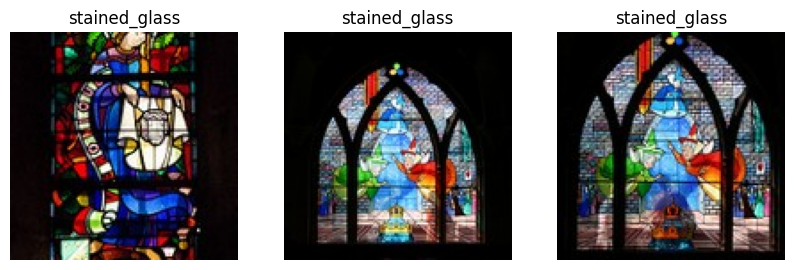

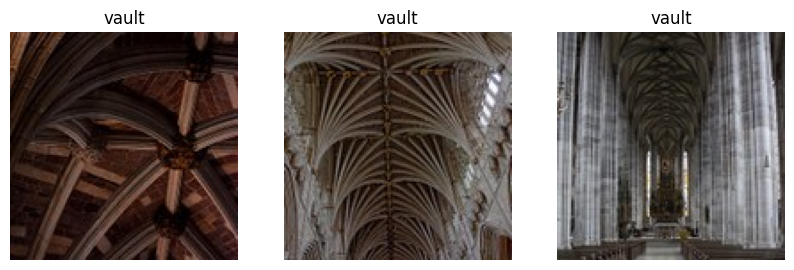

In [41]:
import matplotlib.pyplot as plt
import cv2
import os

display_images_path = {}
for sub_dir in os.listdir(train_data_path):
    dir_path = os.path.join(train_data_path, sub_dir)
    is_dir = os.path.isdir(dir_path)
    if is_dir:
      # if sub_dir == 'portal':
      #   continue # test data does not have portal images , so cant use them for testing
      plt.figure(figsize=(10,5))
      for i in range(3):
        file = os.listdir(dir_path)[i]
        file_path = os.path.join(dir_path, file)
        display_images_path[file_path] = sub_dir
        img = cv2.imread(file_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(1,3,i+1)
        plt.title(sub_dir)
        plt.axis('off')
        plt.imshow(img)
      plt.show()

In [8]:
# create data sets
# using the latest tf.data for efficient input pipelines.
# https://www.tensorflow.org/guide/data

import tensorflow as tf
def get_ds(data_dir,seed = 43,subset='training',validation_split=0.2,image_size=(255,255),batch_size=32):
    train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    seed=seed,
    validation_split = validation_split,
    subset=subset,
    image_size=image_size,
    batch_size=batch_size)
    train_ds.class_names
    return train_ds

data_dir = pathlib.Path(train_data_path)
train_ds = get_ds(data_dir,image_size=(height,width),batch_size=batch_size)
class_names = train_ds.class_names
print(class_names)
type(train_ds)

Found 10411 files belonging to 11 classes.
Using 8329 files for training.
['altar', 'apse', 'bell_tower', 'column', 'dome(inner)', 'dome(outer)', 'flying_buttress', 'gargoyle', 'portal', 'stained_glass', 'vault']


tensorflow.python.data.ops.prefetch_op._PrefetchDataset

In [9]:
val_ds = get_ds(data_dir,subset='validation',image_size=(height,width),batch_size=batch_size)

Found 10411 files belonging to 11 classes.
Using 2082 files for validation.


In [10]:
AUTOTUNE = tf.data.AUTOTUNE


train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)

CNN Model

In [12]:
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow import keras
import warnings
warnings.filterwarnings('ignore')

model = Sequential([

  ##--- starting data augmentation

  layers.RandomFlip("horizontal",input_shape=(height,width,3)),
  layers.RandomRotation(0.1),
  layers.RandomZoom(0.1),
  layers.RandomShear(x_factor=0.1, y_factor=0.1),

  ##---- Data Augmentation ends

  # Image Scaling layer
  layers.Rescaling(1./255, input_shape=(height, width, 3)),

  # First convolution layer.convolution with 32 filters with a 3x3 kernel matrix
  layers.Conv2D(32, (3,3), padding='same', activation='relu'),
  layers.MaxPooling2D(), # Use max pooling

  # Second Convolution layer
  layers.Conv2D(32, (3,3), padding='same', activation='relu'),
  layers.MaxPooling2D(),

  # #Global Average Pooling layer. This does not work as GlobalAveragePooling makes
  # input dimension to the next layer incompatible(Maybe additional transformations are needed?)
  # layers.GlobalAveragePooling2D(),

  # 3rd Convolution layer
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),

  # 4th Convolution layer
  layers.Conv2D(128, 3, padding='same', activation='relu'),
  layers.GlobalMaxPooling2D(),


  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(128, activation='relu'),
  layers.Dropout(0.2),
  layers.Dense(len(class_names))

])

model.compile(optimizer='adam',
              # Recommended for sparse matrix data ( which images are)
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              #These do not work
              # metrics=[keras.metrics.Accuracy(),keras.metrics.Precision(),keras.metrics.Recall()]
              # metrics=['accuracy','precision','recall']
              metrics=['accuracy']
             )
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ random_flip_1 (RandomFlip)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation_1 (RandomRotation)   │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom_1 (RandomZoom)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_shear (RandomShear)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling_1 (Rescaling)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 112, 112, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 56, 56, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 56, 56, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 28, 28, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d_1               │ (None, 128)                 │               0 │
│ (GlobalMaxPooling2D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 11)                  │           1,419 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 136,939 (534.92 KB)

 Trainable params: 136,939 (534.92 KB)

 Non-trainable params: 0 (0.00 B)

In [13]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Extending the ModelCheckPoint class
class MyCheckpoint(ModelCheckpoint):

    def __init__(self,
                 filepath,
                 monitor="val_loss",
                 verbose=0,
                 save_best_only=False,
                 save_weights_only=False,
                 mode="auto",
                 save_freq="epoch",
                 initial_value_threshold=None,
                 ):
        """
        :param filepath: where to save the model
        :param monitor: what to monitor
        :param verbose: 0 = silent, 1 = verbose
        :param save_best_only:
        :param save_weights_only:
        :param mode:
        :param save_freq:
        :param initial_value_threshold:
        """
        super().__init__(filepath,
                         monitor,
                         verbose,
                         save_best_only,
                         save_weights_only,
                         mode,
                         save_freq,
                         initial_value_threshold)

        self.last_epoch_number = 0
    # This function is called at the end of each epoch. I am overriding this method
    def on_epoch_end(self,epoch,logs=None):
        super().on_epoch_end(epoch,logs)
        self.last_epoch_number =  epoch+1
        print(f'epoch {self.last_epoch_number} completed')


In [14]:
from tensorflow.keras.callbacks import EarlyStopping


early_stop=EarlyStopping(monitor='val_loss',mode='min',verbose=1,patience=10,min_delta=0.01)
checkpoint=MyCheckpoint('best_model.keras',monitor='val_loss',mode='min',verbose=1,save_best_only=True)

epochs=100
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  batch_size = batch_size,
  callbacks = [early_stop,checkpoint]
)

Epoch 1/100
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.2356 - loss: 2.0913
Epoch 1: val_loss improved from inf to 1.63219, saving model to best_model.keras
epoch 1 completed
131/131 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - accuracy: 0.2361 - loss: 2.0898 - val_accuracy: 0.4126 - val_loss: 1.6322
Epoch 2/100
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.4339 - loss: 1.5839
Epoch 2: val_loss improved from 1.63219 to 1.45834, saving model to best_model.keras
epoch 2 completed
131/131 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - accuracy: 0.4340 - loss: 1.5835 - val_accuracy: 0.4846 - val_loss: 1.4583
Epoch 3/100
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - accuracy: 0.4944 - loss: 1.4205
Epoch 3: val_loss improved from 1.45834 to 1.27499, saving model to best_model.keras
epoch 3 completed
131/131 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.4944 - loss: 1.4203 - val_accuracy: 0.5432 - val_loss: 1.2750
Epoch 4/100
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - accuracy: 0.5520 - 

In [15]:
# print training accuracy
def print_scores(model,val_ds,train_ds,headline = None):
  print(headline)
  score_test = model.evaluate(val_ds, verbose=0)
  print('Test loss:%.4f' % score_test[0])
  print('Test accuracy:%.4f'% score_test[1])
  score_train= model.evaluate(train_ds, verbose=0)
  print('Train loss:%.4f'% score_train[0])
  print('train accuracy:%.4f'% score_train[1])


In [ ]:
print_scores(model,val_ds,train_ds,'Only CNN Model')

Only CNN Model
Test loss:0.5600
Test accuracy:0.8118
Train loss:0.3709
train accuracy:0.8680


In [16]:
import matplotlib.pyplot as plt
def plot_accuracy_loss_graphs(history,title=None):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']

  loss = history.history['loss']
  val_loss = history.history['val_loss']
  epochs_range = range(checkpoint.last_epoch_number)

  plt.figure(figsize=(8, 8))
  plt.subplot(1, 2, 1)
  plt.plot(epochs_range, acc, label='Training Accuracy')
  plt.plot(epochs_range, val_acc, label='Validation Accuracy')
  plt.legend(loc='lower right')
  plt.title('Training and Validation Accuracy')

  plt.subplot(1, 2, 2)
  plt.plot(epochs_range, loss, label='Training Loss')
  plt.plot(epochs_range, val_loss, label='Validation Loss')
  plt.legend(loc='upper right')
  plt.title('Training and Validation Loss')

  plt.suptitle(f'Graphs for {title}')
  plt.show()


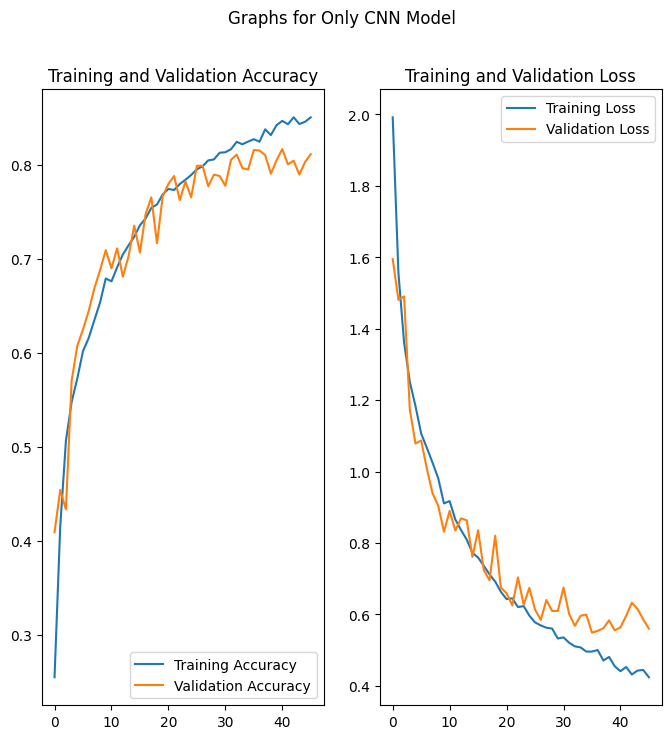

In [ ]:
plot_accuracy_loss_graphs(history,'Only CNN Model')

# Transfer Model #

In [17]:

def tranfer_model_metrics(model):
  score_test = model.evaluate(val_ds, verbose=0)
  print('Test loss:%.4f' % score_test[0])
  print('Test accuracy:%.4f'% score_test[1])

In [18]:
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.xception import Xception

def run_model(model):
  print(model.name)
  model.trainable = False
  model = tf.keras.Sequential([
  tf.keras.layers.GlobalAveragePooling2D(),
  tf.keras.layers.Dense(len(class_names), activation='softmax')

])
  model.compile(optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
  tranfer_model_metrics(model)


model_m = tf.keras.applications.MobileNet(
    input_shape=(height,width,3),
    include_top=False,
    weights="imagenet",
    input_tensor=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax",
    name='MobileNet',
)
run_model(model_m)

model_v = tf.keras.applications.VGG16(
    include_top=False,
    weights="imagenet",
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax",
    name="vgg16",
)
run_model(model_v)


17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
MobileNet
Test loss:127.2524
Test accuracy:0.0980
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
vgg16
Test loss:97.0989
Test accuracy:0.0423


**Transfer Model without image Augmentation**

In [19]:
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow import keras
model_t = Sequential()
model_t.add(model_m)

#------------------------ Augmentation-------------------------------

# model_t.add(layers.RandomFlip("horizontal",input_shape=(height,width,3)))
# model_t.add(layers.RandomRotation(0.1))
# model_t.add(layers.RandomZoom(0.1))

#--------------------- Augmentation ends -------------------------

model_t.add(layers.GlobalAveragePooling2D())

## Dropout at 0.5 produces much lesse overfitting.
## Any lesser value increases training accuracy substantially, but testing acuracy doesnt improve
## Using Dropout as 0.1 as specified in the problem statement gives a training accuracy of 1, but a tetsing accuracy of 65%
## and results in worse classification
dropout = 0.5
model_t.add(layers.Dropout(dropout)) #


model_t.add(layers.Dense(256, activation='relu'))
model_t.add(layers.BatchNormalization())
model_t.add(layers.Dropout(dropout))

model_t.add(layers.Dense(128, activation='relu'))
model_t.add(layers.BatchNormalization())
model_t.add(layers.Dropout(dropout))

model_t.add(layers.Dense(len(class_names),activation='softmax'))
model_t.compile(optimizer='adam',
              # Recommended for sparse matrix data ( which images are)
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              #These do not work
              # metrics=[keras.metrics.Accuracy(),keras.metrics.Precision(),keras.metrics.Recall()]
              # metrics=['accuracy','precision','recall']
              metrics=['accuracy']
)
model_t.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ MobileNet (Functional)               │ (None, 7, 7, 1024)          │       3,228,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_2           │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 256)                 │         262,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 11)                  │           1,419 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,527,115 (13.45 MB)

 Trainable params: 297,483 (1.13 MB)

 Non-trainable params: 3,229,632 (12.32 MB)

In [20]:
from tensorflow.keras.callbacks import EarlyStopping


early_stop=EarlyStopping(monitor='val_loss',mode='min',verbose=1,patience=10,min_delta=0.01)
checkpoint=MyCheckpoint('best_model.keras',monitor='val_loss',mode='min',verbose=1,save_best_only=True)

epochs=100
history = model_t.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  batch_size = batch_size,
  callbacks = [early_stop,checkpoint]
)

Epoch 1/100
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.2444 - loss: 2.7741
Epoch 1: val_loss improved from inf to 0.99400, saving model to best_model.keras
epoch 1 completed
131/131 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - accuracy: 0.2452 - loss: 2.7699 - val_accuracy: 0.6796 - val_loss: 0.9940
Epoch 2/100
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.5261 - loss: 1.5057
Epoch 2: val_loss improved from 0.99400 to 0.81522, saving model to best_model.keras
epoch 2 completed
131/131 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.5263 - loss: 1.5051 - val_accuracy: 0.7382 - val_loss: 0.8152
Epoch 3/100
130/131 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.6144 - loss: 1.2043
Epoch 3: val_loss improved from 0.81522 to 0.77117, saving model to best_model.keras
epoch 3 completed
131/131 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - accuracy: 0.6143 - loss: 1.2045 - val_accuracy: 0.7546 - val_loss: 0.7712
Epoch 4/100
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.6464 - 

In [21]:
print_scores(model_t,val_ds,train_ds,'Transfer Model with no Augmentation')

Transfer Model with no Augmentation
Test loss:0.5500
Test accuracy:0.8208
Train loss:0.4177
train accuracy:0.8653


Transfer Model without image augmentation has improved accuracy a bit

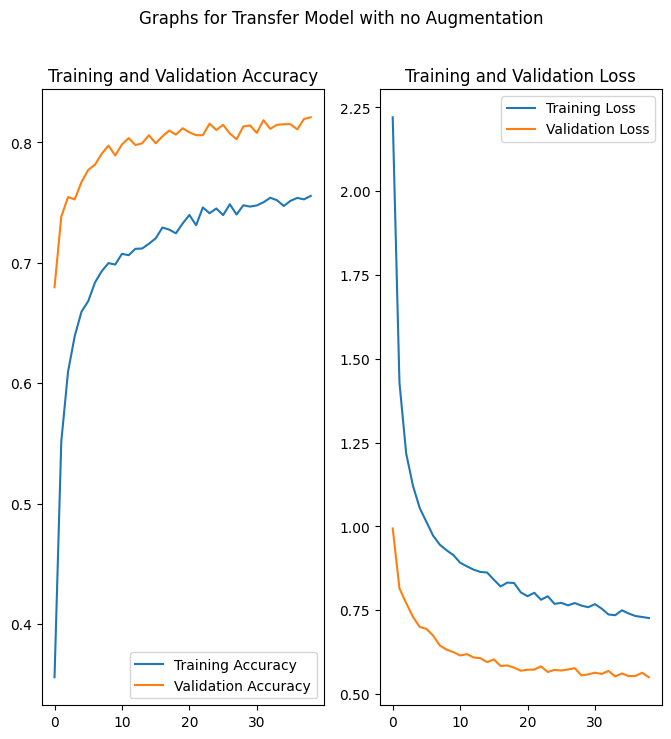

In [22]:
plot_accuracy_loss_graphs(history,'Transfer Model with no Augmentation')

Transfer Model with Image Augmentation layers

In [23]:
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow import keras
model_t = Sequential()
model_t.add(model_m)

#------------------------ Augmentation-------------------------------

model_t.add(layers.RandomFlip("horizontal",input_shape=(height,width,3)))
model_t.add(layers.RandomRotation(0.1))
model_t.add(layers.RandomZoom(0.1))

#--------------------- Augmentation ends -------------------------
model_t.add(layers.GlobalAveragePooling2D())

## Dropout at 0.5 produces much lesse overfitting.
## Any lesser value increases training accuracy substantially, but testing acuracy doesnt improve
## Using Dropout as 0.1 as specified in the problem statement gives a training accuracy of 1, but a tetsing accuracy of 65%
## and results in worse classification
dropout = 0.5
model_t.add(layers.Dropout(dropout)) #


model_t.add(layers.Dense(256, activation='relu'))
model_t.add(layers.BatchNormalization())
model_t.add(layers.Dropout(dropout))

model_t.add(layers.Dense(128, activation='relu'))
model_t.add(layers.BatchNormalization())
model_t.add(layers.Dropout(dropout))

model_t.add(layers.Dense(len(class_names),activation='softmax'))
model_t.compile(optimizer='adam',
              # Recommended for sparse matrix data ( which images are)
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              #These do not work
              # metrics=[keras.metrics.Accuracy(),keras.metrics.Precision(),keras.metrics.Recall()]
              # metrics=['accuracy','precision','recall']
              metrics=['accuracy']
)
model_t.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ MobileNet (Functional)               │ (None, 7, 7, 1024)          │       3,228,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip_2 (RandomFlip)           │ (None, 7, 7, 1024)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation_2 (RandomRotation)   │ (None, 7, 7, 1024)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom_2 (RandomZoom)           │ (None, 7, 7, 1024)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_3           │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 256)                 │         262,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 11)                  │           1,419 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,527,115 (13.45 MB)

 Trainable params: 297,483 (1.13 MB)

 Non-trainable params: 3,229,632 (12.32 MB)

In [24]:
early_stop=EarlyStopping(monitor='val_loss',mode='min',verbose=1,patience=10,min_delta=0.01)
checkpoint=MyCheckpoint('best_model.keras',monitor='val_loss',mode='min',verbose=1,save_best_only=True)

epochs=100
history = model_t.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  batch_size = batch_size,
  callbacks = [early_stop,checkpoint]
)

Epoch 1/100
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.2497 - loss: 2.7123
Epoch 1: val_loss improved from inf to 0.98038, saving model to best_model.keras
epoch 1 completed
131/131 ━━━━━━━━━━━━━━━━━━━━ 22s 114ms/step - accuracy: 0.2506 - loss: 2.7081 - val_accuracy: 0.6892 - val_loss: 0.9804
Epoch 2/100
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.5469 - loss: 1.4567
Epoch 2: val_loss improved from 0.98038 to 0.82615, saving model to best_model.keras
epoch 2 completed
131/131 ━━━━━━━━━━━━━━━━━━━━ 18s 104ms/step - accuracy: 0.5470 - loss: 1.4561 - val_accuracy: 0.7301 - val_loss: 0.8262
Epoch 3/100
130/131 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.6050 - loss: 1.2404
Epoch 3: val_loss improved from 0.82615 to 0.76819, saving model to best_model.keras
epoch 3 completed
131/131 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step - accuracy: 0.6050 - loss: 1.2401 - val_accuracy: 0.7536 - val_loss: 0.7682
Epoch 4/100
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.633

In [25]:
print_scores(model_t,val_ds,train_ds,'Transfer Model with Augmentation')

Transfer Model with Augmentation
Test loss:0.5518
Test accuracy:0.8175
Train loss:0.4096
train accuracy:0.8631


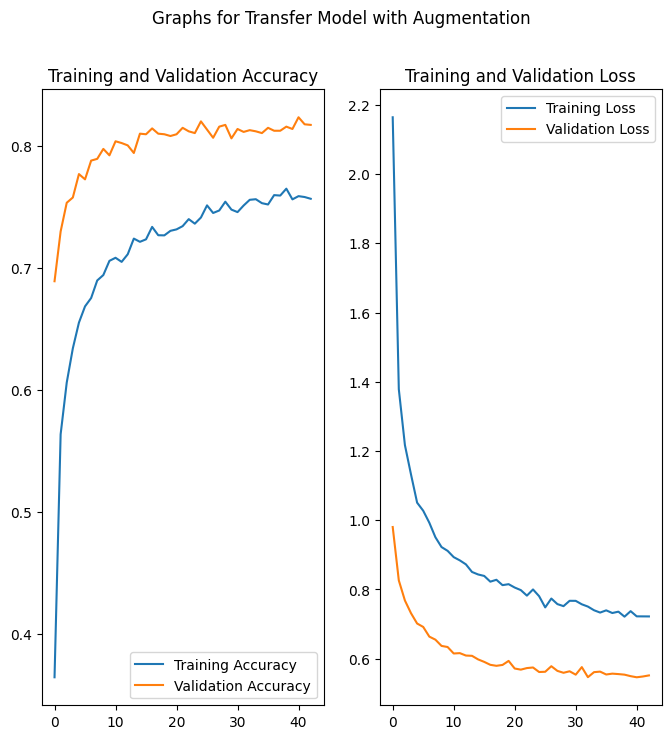

In [26]:
plot_accuracy_loss_graphs(history,'Transfer Model with Augmentation')

In [85]:
import numpy as np
import os



def get_predicted_labels(model,images):
    """
    :param model: the model to use for predictions
    :return: a dictionary of image path and image label derived from predictions
    """

    image_label_map = {}

    for  path,true_label in images.items():
        # path = test_dir+'/'+image
        img = tf.keras.utils.load_img(path, target_size=(height, width))
        img_array = tf.keras.utils.img_to_array(img)
        img_array = tf.expand_dims(img_array, 0) # Create a batch
        predictions = model.predict(img_array,verbose=False)
        score = tf.nn.softmax(predictions[0])
        max_score = np.max(score)
        image_label_map[path] = 'Pred_Label: '+class_names[np.argmax(score)]+'\n True_Label: '+true_label
    return image_label_map


In [87]:
import matplotlib.image as mpimg

def display_predcitions(image_map,model_name):
    print(f'Predictions for {model_name}\n')
    plt.figure(figsize=(20,20))
    for  i, image_path in enumerate(image_map.keys()):
        ax = plt.subplot(10,10,i+1)
        img = mpimg.imread(image_path)
        ax.imshow(img)
        ax.axis('off')
        label = image_map.get(image_path)
        ax.set_title(label,fontsize=8)
    plt.tight_layout()
    plt.show()

In [76]:
import os

def get_images(path):
    images = {}
    for sub_dir in os.listdir(path):
        dir_path = os.path.join(path, sub_dir)
        is_dir = os.path.isdir(dir_path)
        if is_dir:
          for i in range(8):
            image = os.listdir(dir_path)[i]
            image_path = os.path.join(dir_path, image)
            images[image_path] = sub_dir
    return images

Predictions for Predictions with training data set



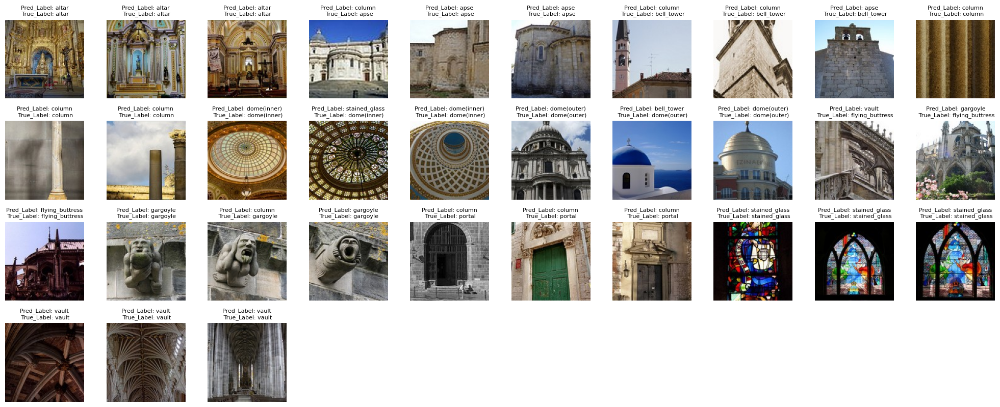

In [88]:

image_label_map = get_predicted_labels(model_t,display_images_path)
display_predcitions(image_label_map,'Predictions with training data set')

See how the model predicted portal as column. Training dataset has the largest images for columns. Since test data does not have portals, the model approximated it to the best trained image.

Predictions for Predictions with test data set



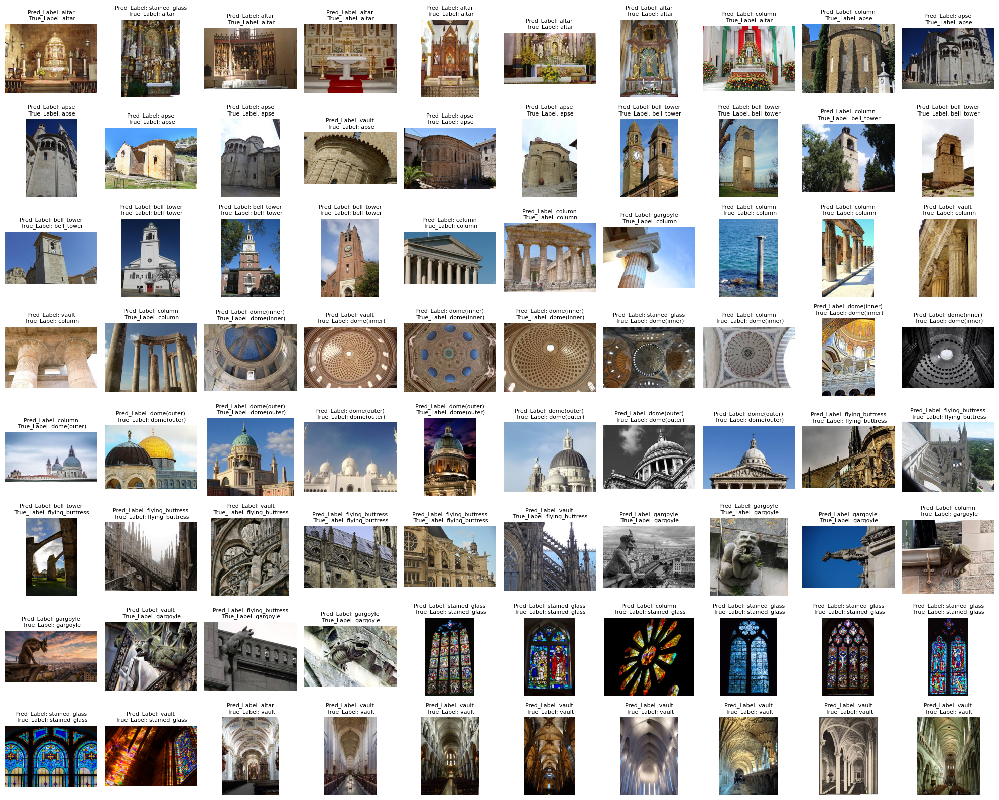

In [89]:
images = get_images(test_data_path)
image_label_map = get_predicted_labels(model_t,images)
display_predcitions(image_label_map,'Predictions with test data set')

#Part 2 - Recommender System#